In [1]:
import sys


import os
import copy
import random
import warnings
from typing import Tuple
from collections import defaultdict

# Third-party library imports
import cv2
import torch
import wandb
import pprint
from tqdm import tqdm

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import torch.nn.functional as F
import albumentations as A
import torch.optim as optim
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt

from torchvision.transforms import ToTensor, Lambda
from torch.optim import lr_scheduler
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter  # Assuming you might use it
from torchsummary import summary
from torchvision import datasets, transforms
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from skimage import io
from torchvision.io.image import decode_jpeg, read_file
import plotly.graph_objects as go
from PIL import Image
# from osgeo import gdal
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
class CountriesDataset(Dataset):
    def __init__(self, images_filepaths, transform=None, target_transform=None):
        self.images_filepaths = images_filepaths
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.images_filepaths)

    def __getitem__(self, idx):
        # Task: Read the RGB image and the label
        filename = self.images_filepaths[idx]
        # dataset = gdal.Open(filename)
        # image = dataset.ReadAsArray()
        image = cv2.imread(filename)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        

        label = os.path.normpath(filename).split(os.sep)[-2]

        if self.transform is not None:
            image = self.transform(image=image)["image"]
        if self.target_transform is not None:
            label = torch.from_numpy(np.array([np.float32(self.target_transform(label))]))
        return image, label


class CoordinatesDataset(Dataset):
    def __init__(self, images_filepaths, coordinates_df, transform=None, target_transform=None):
        self.images_filepaths = images_filepaths
        self.transform = transform
        self.target_transform = target_transform
        self.coordinates_df = coordinates_df

    def __len__(self):
        return len(self.images_filepaths)

    def __getitem__(self, idx):
        # Task: Read the RGB image and the label
        filename = self.images_filepaths[idx]
        # dataset = gdal.Open(filename)
        # image = dataset.ReadAsArray()
        image = cv2.imread(filename)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


        label = self.coordinates_df.loc[int(os.path.normpath(filename).split(os.sep)[-1].split(".")[0])]
        label = torch.from_numpy(np.array([label.x, label.y], dtype=np.float32))
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        if self.target_transform is not None:
            label = self.target_transform(label)
        return image, label




In [3]:
dataset_directory = 'data/Europe'

# root_directory = os.path.join(dataset_directory)

# gb_directory = os.path.join(root_directory, "GB")
# pl_directory = os.path.join(root_directory, "PL")
# images
images = os.listdir(dataset_directory)
images.pop(images.index("coordinates.csv"))
images_filepaths = sorted([os.path.join(dataset_directory, f) for f in os.listdir(dataset_directory)])
# pl_images_filepaths = sorted([os.path.join(pl_directory, f) for f in os.listdir(pl_directory)])


In [4]:
coords_df = pd.read_csv(os.path.join(dataset_directory, "coordinates.csv"))
coords_df = coords_df.drop_duplicates()
coords_df.set_index("id", inplace=True)
# coords_df = coords_df.drop_duplicates()


# pl_coords_df = pd.read_csv(os.path.join(pl_directory, "coordinates.csv"))

In [10]:

import plotly.graph_objects as go
import pandas as pd


i = 0

fig = go.Figure(data=go.Scattergeo(
    lon = [*coords_df.x],
    lat = [*coords_df.y],
    # text = df['text'],
    # mode = 'markers',
    marker_color = ["blue"]
))

fig.update_layout(

    # title = 'Most trafficked US airports<br>(Hover for airport names)',
    geo_scope='europe',
)
fig.show()

In [11]:
len(coords_df)

61754

In [5]:
coords_df

,x,y
id,,
1282221049213495,-3.014699,52.155848
1290667804988986,-4.787481,54.064756
1337997236584209,-4.475950,54.162085
2180908392216585,-3.230073,51.524597
1291953301321509,-3.093118,52.805992
...,...,...
1331837897217045,19.379475,54.141502
1365627300622770,19.607221,54.081385
2867645276884501,20.512422,54.706576


In [111]:
print(cv2.imread("./data/Europe/24208251985432488.jpg"))

None


In [16]:
images_filepaths[0]

'data/Europe\\10019251184814698.jpg'

In [96]:
images_1 = os.listdir("./data/Europe/")

In [97]:
images_1 = [i for i in images_1 if i.endswith(".jpg")]

In [99]:
images_1.index("train_coords.csv")

ValueError: 'train_coords.csv' is not in list

In [100]:
len(images_1)

61754

In [102]:

working_images_filepaths_2 = [i for i in tqdm(images_1) if cv2.imread(i, cv2.IMREAD_REDUCED_COLOR_8) is not None] # this line runs quite slowly
# int(os.path.normpath(i).split(os.sep)[-1].split(".")[0]) in set(coords_df.index) and
# random.seed(42)

# splitting the data
# random.shuffle(correct_images_filepaths)
# train_images_filepaths = correct_images_filepaths[:20000]
# val_images_filepaths = correct_images_filepaths[20000:-10]
# test_images_filepaths = correct_images_filepaths[-10:]

100%|██████████| 61754/61754 [00:01<00:00, 48044.76it/s]


In [108]:
working_images_filepaths_2 = [i for i in tqdm(images_1) if (cv2.imread(os.path.join("./data/Europe/", i), cv2.IMREAD_REDUCED_COLOR_2) is not None)]

100%|██████████| 61754/61754 [00:34<00:00, 1772.39it/s]


In [109]:
len(working_images_filepaths_2)

61753

In [112]:
"24208251985432488.jpg" in working_images_filepaths_2

False

In [106]:
os.path.join("./data/Europe/", images_1[0])

'./data/Europe/10019251184814698.jpg'

In [93]:
working_images_filepaths_2 =[i for i in tqdm(working_images_filepaths) if cv2.imread(i) is not None]

100%|██████████| 61753/61753 [01:27<00:00, 708.26it/s]


In [94]:
len(working_images_filepaths_2)

61753

In [20]:
len(working_images_filepaths)

61753

In [57]:
pd.read_csv("train-split", index_non).T

""
data/Europe\1572853639588344.jpg
data/Europe\1517982695212548.jpg
data/Europe\1380687005645547.jpg
data/Europe\1347839249113127.jpg
data/Europe\1302685230656215.jpg
...
data/Europe\2928635960713180.jpg
data/Europe\1506501789877086.jpg
data/Europe\1289437138403167.jpg
data/Europe\1336227067320912.jpg


In [61]:
coords_df.head()

,x,y
id,,
10019251184814698,-3.313082,57.003470
10069524846422371,20.181889,50.488607
10087598254643385,-1.715838,53.993564
1287417638447311,11.672323,48.003888
1287541681640529,23.731725,37.907376


In [5]:
pd.DataFrame(working_images_filepaths).to_csv("working_images_filepaths.csv", index=False)

NameError: name 'working_images_filepaths' is not defined

In [5]:
working_images_filepaths = list(pd.read_csv("working_images_filepaths.csv")["0"])

In [113]:
working_image_ids = [int(os.path.splitext(os.path.split(i)[-1])[0]) for i in working_images_filepaths_2]

In [114]:
"24208251985432488" in working_image_ids

False

In [6]:
train_ids, test_ids = train_test_split(working_image_ids, train_size=0.7, test_size=0.3, random_state=42)

NameError: name 'working_image_ids' is not defined

In [74]:
val_ids, test_ids = train_test_split(test_ids, train_size=0.66, test_size=0.33, random_state=42)

In [71]:
train_ids

['1572853639588344',
 '1517982695212548',
 '1380687005645547',
 '1347839249113127',
 '1302685230656215',
 '1381453886107495',
 '1380152159211412',
 '1304609536836150',
 '1306898673285071',
 '1307435763005303',
 '1380516499013788',
 '1307919826823912',
 '1674621929415458',
 '1314385939243613',
 '1356296871422137',
 '1379944835712630',
 '1306460453306797',
 '1310332072936002',
 '1425883867776777',
 '1322298048413291',
 '1840641032779959',
 '1397048913962051',
 '1298691074137879',
 '1409260536347541',
 '2872171139777560',
 '1308033039618879',
 '2537871743023016',
 '1434576107171807',
 '1362274470813502',
 '1309329022989171',
 '1617312071807696',
 '1327725947628949',
 '1467406373623568',
 '1558064114396825',
 '1308728530058526',
 '1319767111741049',
 '1308635589537989',
 '1309360392792832',
 '4552307024786563',
 '1489681061832618',
 '3200839323570100',
 '1408760866189054',
 '1657584341102264',
 '1351661988688829',
 '1749310618915000',
 '1393248474374067',
 '1410184115982599',
 '12884956949

In [76]:
train_coords_df = coords_df.loc[train_ids]
val_coords_df = coords_df.loc[val_ids]
test_coords_df = coords_df.loc[test_ids]


In [119]:
train_coords_df.loc["24528655310081244"]

KeyError: '24528655310081244'

In [121]:
24528655310081244 in train_coords_df.id

AttributeError: 'DataFrame' object has no attribute 'id'

In [127]:
24528655310081243 in train_coords_df.index

False

In [115]:
len(train_coords_df), len(val_coords_df)

(43227, 12227)

In [86]:
coords_df.head()

,x,y
id,,
10019251184814698,-3.313082,57.003470
10069524846422371,20.181889,50.488607
10087598254643385,-1.715838,53.993564
1287417638447311,11.672323,48.003888
1287541681640529,23.731725,37.907376


In [90]:
coords_df.iloc[0]

x    -3.313082
y    57.003470
Name: 10019251184814698, dtype: float64

In [91]:
pd.read_csv("data/Europe/test_coords.csv")

,id,x,y
0,1326922821199161,6.567340,43.224107
1,1397952133901214,15.910773,37.936571
2,1314556289142268,22.028707,45.765808
3,1427278077887159,8.927667,40.786082
4,1316209518830719,4.338805,36.542410
...,...,...,...
6109,3729619267285504,24.771406,42.125723
6110,1826771047519185,-3.571700,52.270650
6111,1340647466445309,10.832445,45.927229
6112,2803468089963405,9.548967,42.105625


In [117]:
train_coords_df.to_csv("data/Europe/train_coords.csv")
val_coords_df.to_csv("data/Europe/val_coords.csv")
test_coords_df.to_csv("data/Europe/test_coords.csv")

In [8]:
from train_model import LitDataModule


In [13]:
datamodule = LitDataModule("data/Europe", 32, num_workers=0)
datamodule.setup("fit")
datamodule.train_dataset.transform = None
train_dataset_coords = datamodule.train_dataset


data/Europe
32
id     uint64
x     float64
y     float64
dtype: object
id     uint64
x     float64
y     float64
dtype: object


# Visualization


In [14]:

def display_image_grid(images, labels, cols=5, figsize=(12, 6)):
    rows = len(images) // cols
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=figsize)
    for image, label, subax in zip(images, labels, ax.ravel()):
        subax.imshow(image)
        subax.set_title(label)
        subax.set_axis_off()
    plt.tight_layout()
    plt.show()

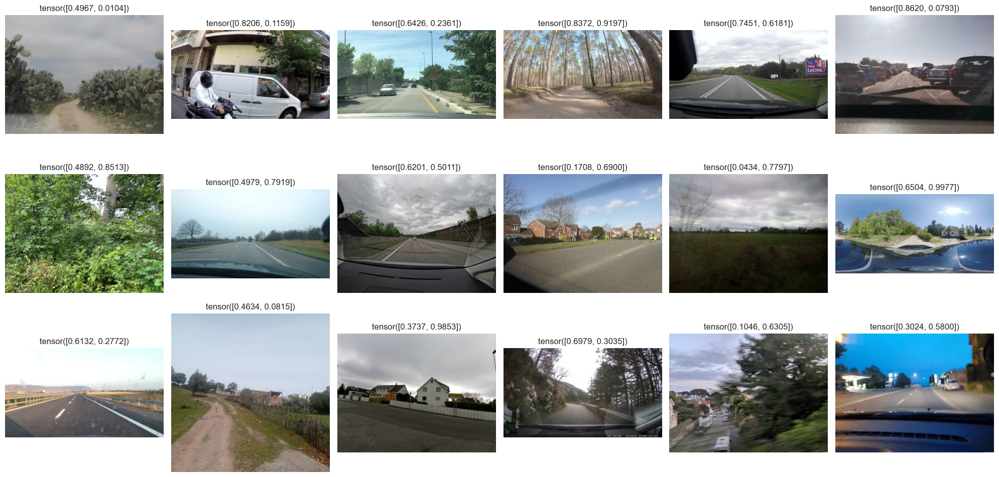

In [15]:
sample = [train_dataset_coords[i] for i in range(20)]

display_image_grid(*zip(*sample), cols=6,figsize=(20,10))

del sample

In [21]:
import seaborn as sns

In [58]:
image, label = train_dataset_coords[0]

In [19]:
images = []
annotations = []
lon = []
lat = []
texts=[]
size = 0.25
y = 1
n_images = 20
colors = sns.color_palette("hls", n_images).as_hex()
sorted_by_coordinates_images = sorted([train_dataset_coords[i] for i in range(n_images)], key=lambda x: tuple(x[1])) 
for i in range(n_images):
    x= (i%4) * size / 3
    if i and (i%4) == 0:
        y -=size
    text = str(i)
    texts.append(text)
    image, label = sorted_by_coordinates_images[i]
    lon.append(datamodule.itransform_x(label[0]))
    lat.append(datamodule.itransform_y(label[1]))
    image = go.layout.Image(
            source=Image.fromarray(image),
            x=x,
            y=y,
            sizex=size,
            sizey=size,
            opacity=1,
    )
    images.append(image)

    annotations.append(dict(
            text=text,
            x=x,
            y=y,
            showarrow=False,
        bgcolor=colors[i]
        ))



In [20]:


fig = go.Figure(data=go.Scattergeo(
    lon = lon,
    lat = lat,
    marker_color = colors,
    text = texts

))

fig.update_layout(
    geo_scope='europe',
)
fig.update_layout(
    images=images,
    annotations=annotations
)

fig.show()

In [12]:
params = {
    "batch_size": 32
}

# Country model

In [51]:


# pay attention that albumentations expect your images to come in HWC (or HW) format.
le = preprocessing.LabelEncoder()
le.fit(["GB", "PL"])


target_transform = Lambda(lambda y: le.transform([y])[0])
train_transform = A.Compose(
    [
        A.SmallestMaxSize(max_size=192),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=10, p=0.5),
        A.RandomCrop(height=128, width=128),
        A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.CoarseDropout(max_width=20, max_height=20, p=0.5),
        A.Normalize(),
        ToTensorV2(),
    ]
)

train_dataset_coords = CoordinatesDataset(images_filepaths=train_filepaths, coordinates_df=coords_df, transform=train_transform)


In [68]:
val_transform = A.Compose(
    [
        A.SmallestMaxSize(max_size=150),
        A.CenterCrop(height=128, width=128), # not RandomCrop!
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
val_dataset = CountriesDataset(images_filepaths=val_filepaths, transform=val_transform, target_transform=target_transform)

In [42]:
def visualize_augmentations(dataset, idx=0, samples=10, cols=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    rows = samples // cols
    figure: plt.Figure
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*1.5, rows*1.5), gridspec_kw={"wspace":0, "hspace":0})
    figure.patch.set_visible(False)
    for i in range(samples):
        image, label = dataset[idx]
        ax.ravel()[i].imshow(image)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    plt.show()

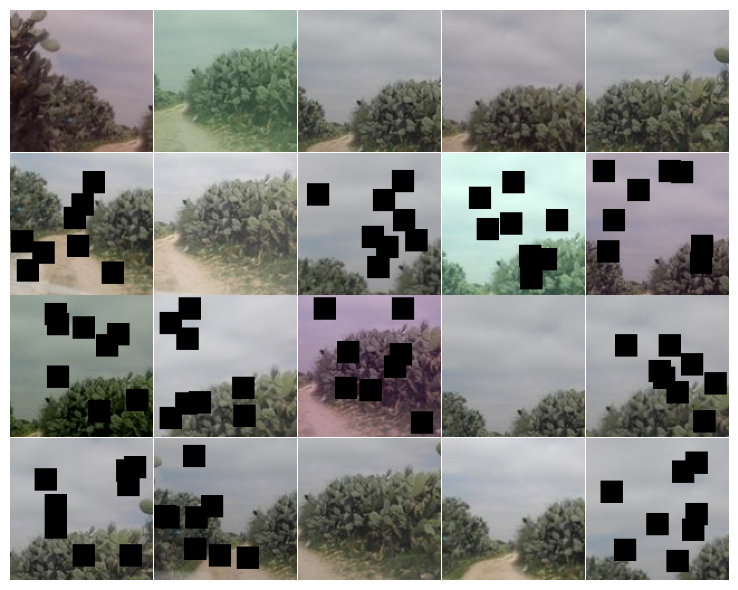

In [52]:
random.seed(42)
visualize_augmentations(train_dataset_coords, samples=20)

In [63]:
def calculate_accuracy(output, target):
    # here the final activation is sigmoid, as it's binary classification problem.
    output = torch.sigmoid(output) >= 0.5
    target = target == 1.0
    return torch.true_divide((target == output).sum(dim=0), output.size(0)).item()

In [62]:
# here you have the class for fancy metrics tracking

class MetricMonitor:
    def __init__(self, float_precision=3):
        self.float_precision = float_precision
        self.reset()

    def reset(self):
        self.metrics = defaultdict(lambda: {"value": 0, "count": 0, "avg": 0})

    def update(self, metric_name, val):
        metric = self.metrics[metric_name]

        metric["value"] += val
        metric["count"] += 1
        metric["avg"] = metric["value"] / metric["count"]

    def __str__(self):
        return " | ".join(
            [
                "{metric_name}: {avg:.{float_precision}f}".format(
                    metric_name=metric_name, avg=metric["avg"], float_precision=self.float_precision
                )
                for (metric_name, metric) in self.metrics.items()
            ]
        )

In [69]:
# @profile
def train(train_loader, model, criterion, optimizer, epoch, calculate_accuracy=calculate_accuracy, **params):
    metric_monitor = MetricMonitor()
    model.train()
    stream = tqdm.tqdm(train_loader)

    for i, (images, target) in enumerate(stream, start=1):
        images = images.to(params["device"], non_blocking=True)
        ## would be much more convenient if the labels were already transformed
        target = target.to(params["device"], non_blocking=True).view(-1,1)

        output = model(images)
        loss = criterion(output, target)
        # accuracy = calculate_accuracy(output, target)
        # metric_monitor.update("Loss", loss.item())
        # metric_monitor.update("Accuracy", accuracy)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        stream.set_description(
            "Epoch: {epoch}. Train.      {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
        )
    return metric_monitor.metrics["Loss"]["avg"]

In [58]:

def validate(val_loader, model, criterion, epoch, calculate_accuracy=calculate_accuracy, **params):
    metric_monitor = MetricMonitor()
    model.eval()
    stream = tqdm.tqdm(val_loader)
    with torch.no_grad():
        for i, (images, target) in enumerate(stream, start=1):
            images = images.to(params["device"], non_blocking=True)
            target = target.to(params["device"], non_blocking=True).view(-1,1)

            output = model(images)
            loss = criterion(output, target)
            accuracy = calculate_accuracy(output, target)

            metric_monitor.update("Loss", loss.item())
            metric_monitor.update("Accuracy", accuracy)
            stream.set_description(
                "Epoch: {epoch}. Validation. {metric_monitor}".format(epoch=epoch, metric_monitor=metric_monitor)
            )

# 

In [27]:
# Instead of creating our own model here - we'll use a pretrained one.

params = {
    "model_name": "resnet18",
    "device": DEVICE,
    "lr": 0.001,
    "batch_size": 32,
    # "num_workers": 4, # change to appropriate (see above), or just remove
    "epochs": 8,
}

In [59]:
model = getattr(models, params["model_name"])(pretrained=False, num_classes=1,)
model = model.to(params["device"])
criterion = nn.BCEWithLogitsLoss().to(params["device"])
optimizer = optim.Adam(model.parameters(), lr=params["lr"])

In [72]:
train_loader = DataLoader(
    train_dataset, batch_size=params["batch_size"], shuffle=True, pin_memory=True,
)
val_loader = DataLoader(
    val_dataset, batch_size=params["batch_size"], shuffle=False, pin_memory=True,
)



In [16]:
with open("train-split2") as f:
    l = f.readline()
    test_filepaths = l.split(",")

In [17]:
test_filepaths

['data\\PL\\1295476997825226.jpg',
 'data\\GB\\1376970492662833.jpg',
 'data\\PL\\2835861130010370.jpg',
 'data\\PL\\1299338394168938.jpg',
 'data\\GB\\1378379182525853.jpg',
 'data\\PL\\1287490721962068.jpg',
 'data\\PL\\1338409183732395.jpg',
 'data\\GB\\1294098677754264.jpg',
 'data\\PL\\1429257770744998.jpg',
 'data\\PL\\1447606195673016.jpg',
 'data\\GB\\1297865850932070.jpg',
 'data\\PL\\1686047881581645.jpg',
 'data\\PL\\1422982084958402.jpg',
 'data\\GB\\1481881449214518.jpg',
 'data\\PL\\1564791717596772.jpg',
 'data\\PL\\1769331643526393.jpg',
 'data\\GB\\2221104751357850.jpg',
 'data\\PL\\1295319007665840.jpg',
 'data\\PL\\1740835922948663.jpg',
 'data\\PL\\1519284372240971.jpg',
 'data\\GB\\1296433091236133.jpg',
 'data\\GB\\1330262647386102.jpg',
 'data\\PL\\1374555896492199.jpg',
 'data\\PL\\1819147011587369.jpg',
 'data\\GB\\1280661599255855.jpg',
 'data\\PL\\1337460970024251.jpg',
 'data\\PL\\1286643851733064.jpg',
 'data\\GB\\1384434078953096.jpg',
 'data\\GB\\25540726

In [21]:
test_transform = A.Compose(
    [
        A.SmallestMaxSize(max_size=150),
        A.CenterCrop(height=128, width=128), # not RandomCrop!
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)
test_dataset = CountriesDataset(images_filepaths=test_filepaths, transform=test_transform, target_transform=target_transform)

In [56]:
test_loader = DataLoader(
    test_dataset, batch_size=20, shuffle=False, pin_memory=True,
)

In [83]:
for epoch in range(1, 30):
    train(train_loader, model, criterion, optimizer, epoch, **params)
    validate(val_loader, model, criterion, epoch, **params)

Epoch: 1. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.98it/s]
Epoch: 1. Validation. Loss: 0.672 | Accuracy: 0.576: 100%|██████████| 60/60 [00:03<00:00, 16.53it/s]
Epoch: 2. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.50it/s]
Epoch: 2. Validation. Loss: 0.608 | Accuracy: 0.681: 100%|██████████| 60/60 [00:03<00:00, 16.42it/s]
Epoch: 3. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.38it/s]
Epoch: 3. Validation. Loss: 0.602 | Accuracy: 0.685: 100%|██████████| 60/60 [00:03<00:00, 16.26it/s]
Epoch: 4. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.34it/s]
Epoch: 4. Validation. Loss: 0.589 | Accuracy: 0.685: 100%|██████████| 60/60 [00:03<00:00, 16.40it/s]
Epoch: 5. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.20it/s]
Epoch: 5. Validation. Loss: 0.568 | Accuracy: 0.718: 100%|██████████| 60/60 [00:03<00:00, 16.42it/s]
Epoch: 6. Train.      : 100%|██████████| 211/211 [00:15<00:00, 13.44it/s]
Epoch: 6. Validation. Loss: 0.589 | Accuracy: 0.694

In [65]:
validate(test_loader, model, criterion, 1, **params)

Epoch: 1. Validation. Loss: 0.301 | Accuracy: 0.870: 100%|██████████| 338/338 [00:17<00:00, 19.30it/s]


In [48]:
model.conv1.requires_grad = False
model.bn1.requires_grad = False
model.relu.requires_grad = False
model.maxpool.requires_grad = False
for i in model.layer1.parameters():
    i.requires_grad = False
for i in model.layer2.parameters():
    i.requires_grad = False
for i in model.layer3.parameters():
    i.requires_grad = False

In [113]:
model.layer2

Sequential(
  (0): Bottleneck(
    (conv1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(256, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (downsample): Sequential(
      (0): Conv2d(512, 1024, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): Bottleneck(
    (conv1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Co

In [32]:
torch.cuda.empty_cache()

In [66]:
# version = 

In [84]:
torch.save(model, "resnet18v{}".format(version))
version+=1

# Coordinate Model

In [2]:
from train_model import LitDataModule

In [3]:
datamodule = LitDataModule("data/Europe", 1, num_workers=0)

data/Europe
1


In [4]:
datamodule.setup("test")

id      int64
x     float64
y     float64
dtype: object


In [5]:
test_dataloader = datamodule.test_dataloader()

AttributeError: 'LitDataModule' object has no attribute 'test_dataset'

In [ ]:
import model_architectures.model_factory as model_factory

In [ ]:
model_dict = torch.load("model_23.pth")

In [ ]:
model = model_factory.get_model("ResNet18")
model.load_state_dict(model_dict)
model.to(DEVICE)

In [ ]:
model.eval()
with torch.no_grad():
    for images, labels in test_dataloader:
        images = images.to(DEVICE)
        pred_labels = model(images)
        
        break

In [234]:
import plotly.graph_objects as go

import pandas as pd


i = 0
for pred, label in zip(predictions, correct_labels):
    fig = go.Figure(data=go.Scattergeo(
        lon = [label[0], pred[0]],
        lat = [label[1], pred[1]],
        # text = df['text'],
        # mode = 'markers',
        marker_color = ["green", "red"],
    ))

    fig.update_layout(
        
        # title = 'Most trafficked US airports<br>(Hover for airport names)',
        geo_scope='europe',
    )
    fig.show()

In [8]:
bboxes = pd.read_json("bounding-boxes.json")
   

In [9]:
minx, miny, maxx, maxy = bboxes["GB"].loc[1]
gb_center = (minx + maxx) / 2, (miny + maxy) / 2
minx, miny, maxx, maxy = bboxes["PL"].loc[1]
pl_center = (minx + maxx) / 2, (miny + maxy) / 2

In [249]:
test_loader_coords = DataLoader(
    test_dataset_coords, batch_size=len(test_dataset_coords), shuffle=False, pin_memory=True,
)

In [255]:
model_coords.eval()
predictions = []
correct_labels = []
with torch.no_grad():
    for image, target in test_loader_coords:
        image = image.to(params["device"], non_blocking=True)
        target = target.to(params["device"], non_blocking=True)
        output = model_coords(image)
        predictions = output.to(device="cpu").numpy()
        correct_labels = target.to(device="cpu").numpy()
        break

In [256]:
dist_to_gb = ((predictions - gb_center)**2).sum(axis=1)
dist_to_pl = ((predictions - pl_center)**2).sum(axis=1)

In [257]:
output = torch.from_numpy((dist_to_gb > dist_to_pl).astype(np.float32)).view(-1,1)

In [136]:
output

tensor([[0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [0.],
        [0.],
        [0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [0.],
        [1.],
      

In [253]:
labels = torch.from_numpy(np.array([i[1] for i in test_dataset]).astype(np.float32)).view(-1,1)

In [134]:
labels

tensor([[1.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [1.],
        [0.],
        [0.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [1.],
        [0.],
        [1.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
        [0.],
        [1.],
        [1.],
        [1.],
        [0.],
        [1.],
        [0.],
        [1.],
        [0.],
        [1.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
        [0.],
        [1.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [0.],
        [1.],
        [1.],
        [0.],
        [0.],
      

In [258]:
calculate_accuracy(output, labels)


0.5267015695571899

# SHAP

In [12]:
model = torch.load("resnet18v5")

In [24]:
import shap

batch = next(iter(test_loader))
images, _ = batch
# images = images.view(-1, 1, 28, 28)
# images.to(device=DEVICE)
images = images.to(device=DEVICE)
background = images[20:]
test_images= images[:20]

e = shap.DeepExplainer(model.to(device=DEVICE), images)
shap_values = e.shap_values(test_images)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


In [50]:
inv_normalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.255],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.255]
)

# Apply inverse normalization to your tensor
inv_normalized_tensor = inv_normalize(test_images.cpu())

(32, 2)

In [239]:
labels.numpy().astype(np.int64)

AttributeError: 'Tensor' object has no attribute 'astype'

In [241]:
inverse_labels = le.inverse_transform(labels.numpy().astype(np.int64))

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


[(array([18.043236, 49.898376], dtype=float32),
  array([23.826643, 54.79975 ], dtype=float32),
  'PL'),
 (array([-2.9151459, 54.617775 ], dtype=float32),
  array([-4.630504, 54.093636], dtype=float32),
  'GB'),
 (array([12.563572, 52.280304], dtype=float32),
  array([23.790081, 52.378002], dtype=float32),
  'PL'),
 (array([12.506968, 52.011265], dtype=float32),
  array([14.999738, 51.156918], dtype=float32),
  'PL'),
 (array([-1.7931967, 53.854813 ], dtype=float32),
  array([-3.1802473, 51.52299  ], dtype=float32),
  'GB'),
 (array([16.852737, 51.7599  ], dtype=float32),
  array([23.85121 , 53.712494], dtype=float32),
  'PL'),
 (array([ 2.1638923, 53.14211  ], dtype=float32),
  array([19.209023, 53.755394], dtype=float32),
  'PL'),
 (array([24.335735, 52.232006], dtype=float32),
  array([23.831768, 52.41147 ], dtype=float32),
  'PL'),
 (array([-2.1668353, 54.743652 ], dtype=float32),
  array([-2.4025035, 57.53452  ], dtype=float32),
  'GB'),
 (array([-1.0375329, 55.05853  ], dtype=flo

In [34]:
model.eval()
with torch.no_grad():
    for i, (images, target) in enumerate(test_loader):
        
        images = images.to(params["device"], non_blocking=True)
        target = target.to(params["device"], non_blocking=True).view(-1,1)
        output = model(images)

        accuracy = calculate_accuracy(output, target)
        break

In [39]:
output_ = torch.sigmoid(output) >= 0.5
target_ = target == 1.0
# torch.true_divide((target == output).sum(dim=0), output.size(0)).item()

In [46]:
le.inverse_transform(target_.T.cpu()[0].numpy().astype(int))

array(['PL', 'GB', 'PL', 'PL', 'GB', 'PL', 'PL', 'GB', 'PL', 'PL', 'GB',
       'PL', 'PL', 'GB', 'PL', 'PL', 'GB', 'PL', 'PL', 'PL'], dtype='<U2')

In [52]:
le.inverse_transform(output_.T.cpu()[0].numpy().astype(int))

array(['PL', 'GB', 'PL', 'GB', 'GB', 'PL', 'GB', 'GB', 'PL', 'GB', 'GB',
       'PL', 'PL', 'GB', 'PL', 'PL', 'GB', 'PL', 'PL', 'PL'], dtype='<U2')

In [54]:
_ = list(
    *zip(
        *zip(
            [
                "p:{} c:{}".format(p, c),
                # c[0],
                # c[1]

            ]
            for p, c in zip(le.inverse_transform(output_.T.cpu()[0].numpy().astype(int)), le.inverse_transform(target_.T.cpu()[0].numpy().astype(int)))
        )
    )
)
# labels_for_plotting = list(zip(*_))
labels_for_plotting = np.array(_)
shap.image_plot(np.swapaxes(np.swapaxes(shap_values, 2, 3), 1, 3), np.swapaxes(np.swapaxes(inv_normalize(test_images.cpu()).numpy(), 2, 3), 1, 3), labels_for_plotting)

In [38]:
le.inverse_transform([0])

array(['GB'], dtype='<U2')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

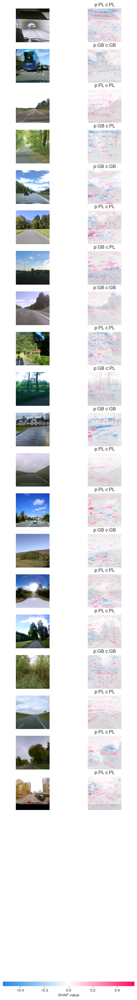

In [55]:
shap.image_plot(np.swapaxes(np.swapaxes(shap_values, 2, 3), 1, 3), np.swapaxes(np.swapaxes(inv_normalize(test_images.cpu()).numpy(), 2, 3), 1, 3), labels_for_plotting)

In [230]:
[zip(predictions, correct_labels])

(array([[-2.8740733, 54.927917 ],
        [22.092913 , 53.860756 ],
        [18.699594 , 50.892433 ],
        ...,
        [20.539875 , 52.86345  ],
        [14.463572 , 50.83242  ],
        [16.656015 , 49.77391  ]], dtype=float32),
 array([[-2.1349585, 57.486996 ],
        [22.148924 , 53.306606 ],
        [14.495843 , 50.281025 ],
        ...,
        [21.118021 , 52.285015 ],
        [16.740967 , 49.255203 ],
        [-2.174384 , 57.196266 ]], dtype=float32))

In [23]:

batch = next(iter(test_loader))
images, _ = batch
# images = images.view(-1, 1, 28, 28)
# images.to(device=DEVICE)
images = images.to(device=DEVICE)
test_images= images[:20]

e = shap.DeepExplainer(model_coords.to(device=DEVICE), images)
shap_values = e.shap_values(test_images)

NameError: name 'model_coords' is not defined

In [228]:
shap_numpy = [np.swapaxes(np.swapaxes(s, 1, -1), 1, 2) for s in shap_values]

In [212]:
shap_numpy

[array([[[[ 2.72842459e-02, -2.86013186e-02, -1.24434754e-01],
          [ 3.49910818e-02, -1.28032714e-02, -8.31032544e-02],
          [ 3.66759524e-02, -3.73202935e-03, -1.47692543e-02],
          ...,
          [ 4.81626717e-03,  6.22374052e-03, -6.51174691e-03],
          [ 1.13306101e-02,  1.09102372e-02,  3.16257067e-02],
          [ 1.19188782e-02,  7.68472254e-03,  3.69086266e-02]],
 
         [[ 2.19728835e-02, -1.63913518e-02, -7.36383274e-02],
          [ 9.93704610e-03,  2.70776115e-02,  5.52310832e-02],
          [ 1.98139157e-02,  4.81406078e-02,  1.90468758e-01],
          ...,
          [ 1.32739423e-02,  3.60135436e-02,  9.48116835e-03],
          [ 5.63499844e-03,  8.17408133e-03,  3.60164270e-02],
          [-9.56282672e-03, -1.35132787e-03,  2.07508393e-02]],
 
         [[ 5.28321192e-02, -2.04495480e-03, -1.09330732e-02],
          [ 3.52854840e-02,  2.46754941e-02,  1.23396695e-01],
          [ 3.04053631e-02,  6.21799231e-02,  2.50963926e-01],
          ...,
    

In [267]:
labels_for_vis = ["pred: {} | coor: {} | label: {}".format(tuple(p),tuple(c),l) for p, c, l in zip(predictions[:20], correct_labels[:20], inverse_labels[:20])]

In [330]:
_ = list(
    *zip(
        *zip(
    [
        "px:{:2f} cx:{:2f}".format(p[0], c[0]),
        "py:{:2f} cy:{:2f}".format(p[1], c[1])
        # c[0],
        # c[1]
        
    ]
    for p, c in zip(predictions[:20], correct_labels[:20])
    )
)
)
# labels_for_plotting = list(zip(*_))
labels_for_plotting = np.array(_)


In [318]:
len((predictions[:20]))

20

In [327]:
predictions[:20]

array([[18.043236  , 49.898376  ],
       [-2.9151459 , 54.617775  ],
       [12.563572  , 52.280304  ],
       [12.506968  , 52.011265  ],
       [-1.7931967 , 53.854813  ],
       [16.852737  , 51.7599    ],
       [ 2.1638923 , 53.14211   ],
       [24.335735  , 52.232006  ],
       [-2.1668353 , 54.743652  ],
       [-1.0375329 , 55.05853   ],
       [15.757435  , 51.87169   ],
       [-0.56317174, 55.03951   ],
       [15.008787  , 51.719887  ],
       [-2.7497945 , 55.12109   ],
       [17.486935  , 50.232285  ],
       [17.554033  , 50.81698   ],
       [-3.7653403 , 53.434555  ],
       [15.827204  , 51.942204  ],
       [-0.6369524 , 53.42296   ],
       [13.594515  , 51.19786   ]], dtype=float32)

In [321]:
len(labels_for_plotting)

20

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

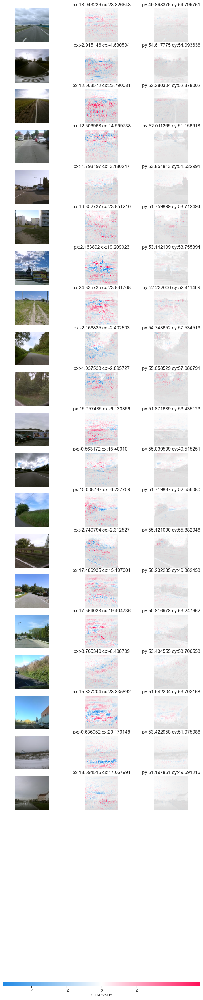

In [331]:
shap.image_plot(shap_numpy, np.swapaxes(np.swapaxes(inv_normalize(test_images.cpu()).numpy(), 2, 3), 1, 3), labels_for_plotting)